Have you ever wondered if it's possible to restore a damaged or defect image? 

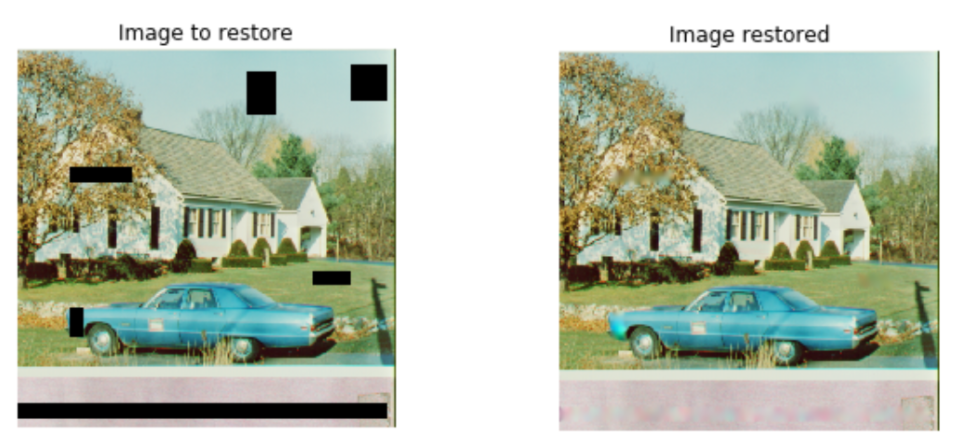

This could have happened because your laptop memory got corrupted. Or, it could also be a picture of your grandparents that over time has been scratched and now is somewhat deteriorated. Whatever happened, the cool thing is that yes, you can restore them.

Besides fixing damaged images, image restoration or reconstruction, is also used for text removing, deleting logos from images and even removing small objects, like tattoos you prefer not to show on a picture.

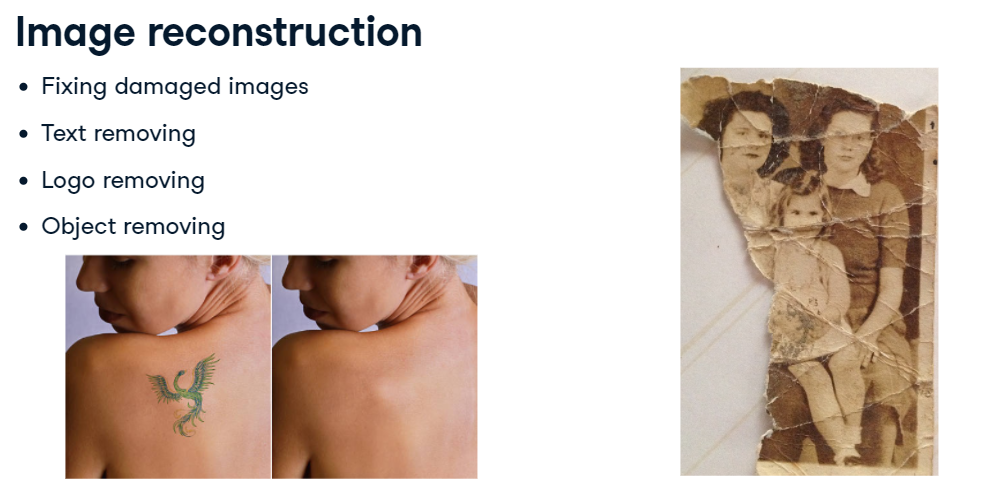

Reconstructing lost or deteriorated parts of images is known as inpainting. 

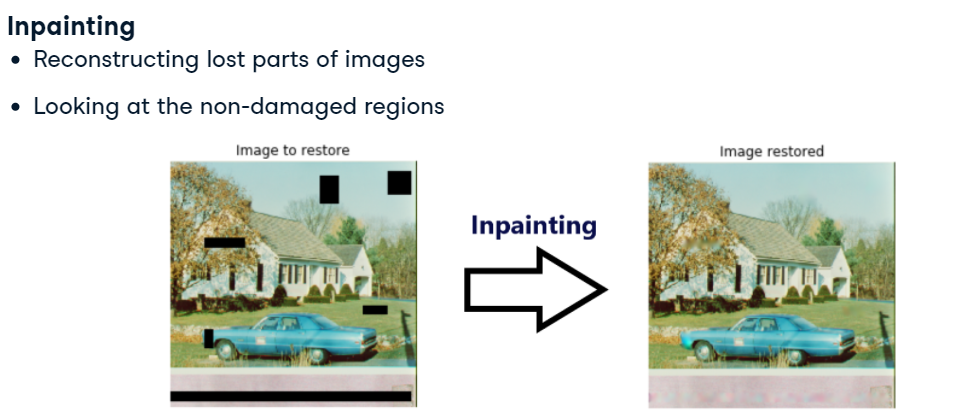

The reconstruction is supposed to be performed in a fully automatic way by exploiting the information presented in non-damaged regions of the image.

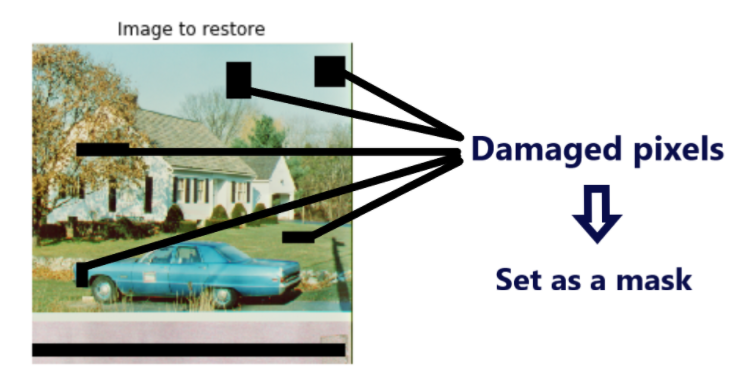

In scikit-image, we can apply inpainting with the inpaint biharmonic function, from the restoration module. It needs the location of the damaged pixels to be filled, as a mask image on top of the image to work with. A mask image is simply an image where some of the pixel intensity values are zero, and others are non-zero.

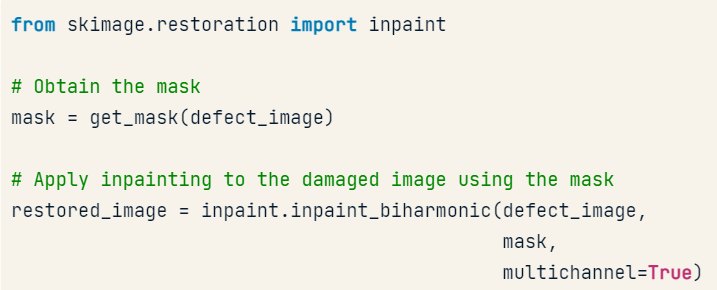

To use this function we first need to import the module and function. Having the image with the defect already loaded, we need to set the mask with the location of the damaged pixels in the image. 

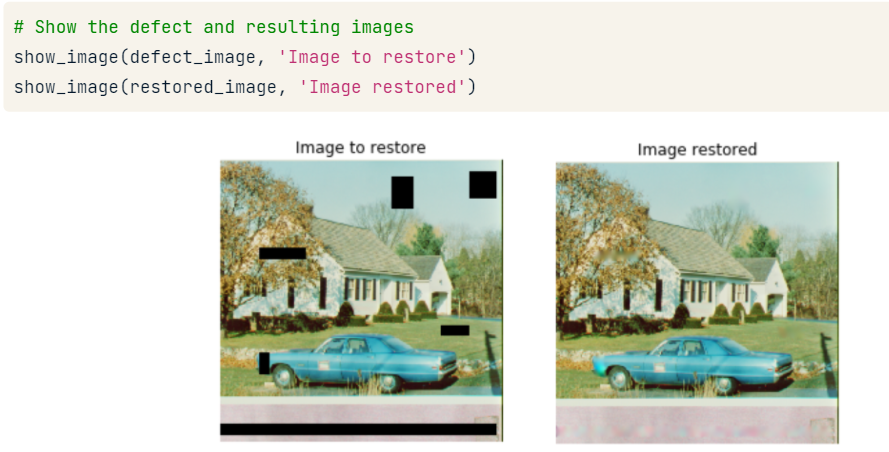

Remember that images are matrix of pixels. For this, in the course, we use the get_mask() function. This is something that we'll take a closer look at in a moment. 

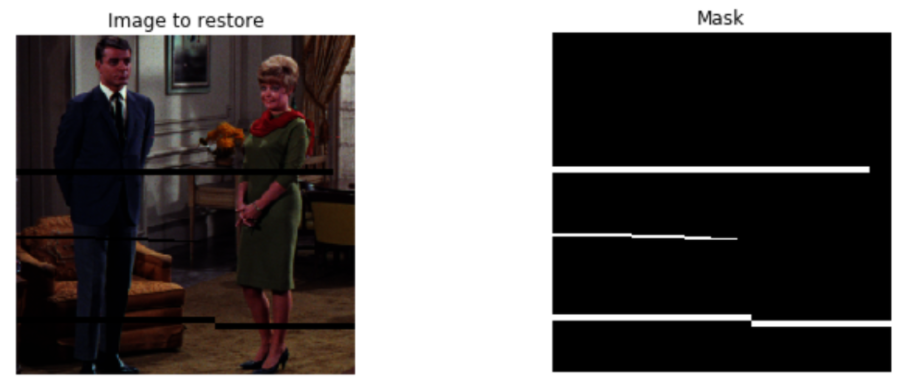

Once we have the mask, we can invoke the inpaint_biharmonic function to apply it to the image with the defect. This will be passed as the first parameter, then the mask, and optionally we can set a boolean for the multichannel. Set it to true if the image is colored. Then we can look at the resulting image.

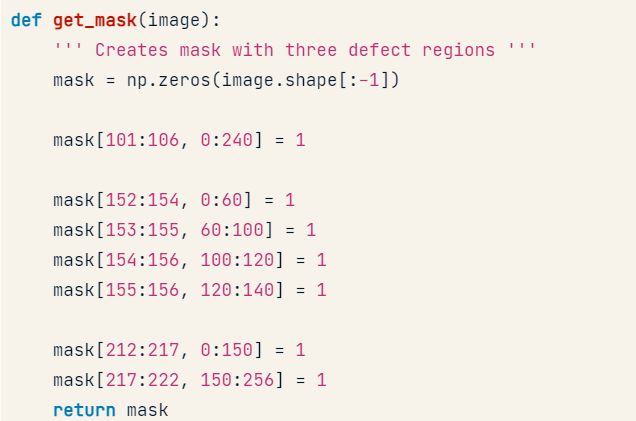

We look at the original image with the defect and the resulting restored image to compare them. In this example, we can see how the masked pixels get inpainted by the inpainting algorithm based on the biharmonic equation assumption.

Imagine you have an old picture of your parents you want to fix. In this image, we intentionally added the missing pixels by setting them to black. In case you want to remove an object you can manually delineate it in the mask. And if you want to automatically detect it, you would need to use Thresholding or segmentation to do so. Something we will learn later on. In the right image we see the damaged areas of the image as a mask.

The scikit-image inpainting function requires the mask to be an array of pixels that need to be inpainted. This mask has to be the same shape as one of the image channels. Unknown pixels have to be represented with 1 and known pixels with 0. So we add the missing pixels by copying the image and turning the pixels into a numpy array of zeros, meaning it's empty. We only copy the width and height dimensions of the image, excluding the color dimension, in this case RGB-3. And then, set the 1s in the specific areas we want to be treated as lost.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

plt.rcParams['figure.figsize'] = (10, 8)

### Let's restore a damaged image
In this exercise, we'll restore an image that has missing parts in it, using the `inpaint_biharmonic()` function.

We'll work on an image with damaged. Some of the pixels have been replaced by 1s using a binary mask, on purpose, to simulate a damaged image. Replacing pixels with 1s turns them totally black.

The mask is a black and white image with patches that have the position of the image bits that have been corrupted. We can apply the restoration function on these areas.

![rs](./images/damaged_astronaut.png)

Remember that inpainting is the process of reconstructing lost or deteriorated parts of images and videos.


In [2]:
def show_image(image, title='Image', cmap_type='gray'):
    plt.imshow(image, cmap=cmap_type)
    plt.title(title)
    plt.axis('off')
    
def plot_comparison(img_original, img_filtered, img_title_filtered):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 8), sharex=True, sharey=True)
    ax1.imshow(img_original, cmap=plt.cm.gray)
    ax1.set_title('Original')
    ax1.axis('off')
    ax2.imshow(img_filtered, cmap=plt.cm.gray)
    ax2.set_title(img_title_filtered)
    ax2.axis('off')

In [9]:
def get_mask(image):
    # Create mask with three defect regions: left, middle, right respectively
    mask = np.zeros(image.shape[:-1])
    mask[101:106, 0:240] = 1
    mask[152:154, 0:60] = 1
    mask[153:155, 60:100] = 1
    mask[154:156, 100:120] = 1
    mask[155:156, 120:140] = 1
    
    mask[212:217, 0:150] = 1
    mask[217:222, 150:256] = 1

    return mask 

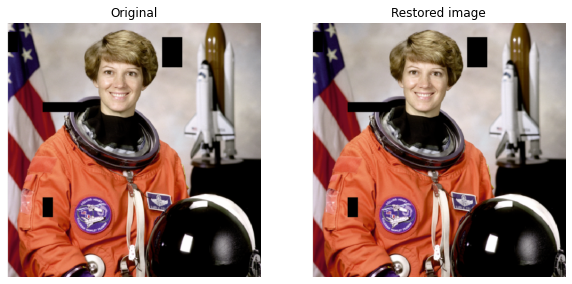

In [10]:
from skimage.restoration import inpaint
from skimage.transform import resize
from skimage import color

defect_image = plt.imread('./images/damaged_astronaut.png')
defect_image = resize(defect_image, (512, 512))
defect_image = color.rgba2rgb(defect_image)

mask = get_mask(defect_image)

# Apply the restoration function to the image using the mask
restored_image = inpaint.inpaint_biharmonic(defect_image, mask, multichannel=True)# Show ther defective image
plot_comparison(defect_image, restored_image, 'Restored image')

### Removing logos
As we saw in the video, another use of image restoration is removing objects from an scene. In this exercise, we'll remove the Datacamp logo from an image.

You will create and set the mask to be able to erase the logo by inpainting this area.

Remember that when you want to remove an object from an image you can either manually delineate that object or run some image analysis algorithm to find it.

![rst](./images/4.2.06-with-new-logo.png)



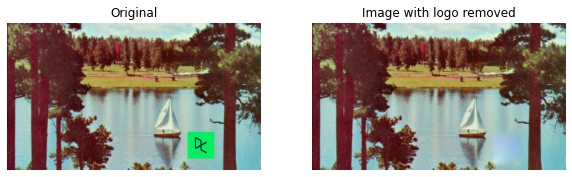

In [12]:
from skimage.restoration import inpaint
from skimage.transform import resize
from skimage import color

image_with_logo = plt.imread('./images/4.2.06-with-new-logo.png')

# Initialize the mask
mask = np.zeros(image_with_logo.shape[:-1])

# Set the pixels where the logo is to 1
mask[210:290, 360:425] = 1

# Apply inpainting to remove the logo
image_logo_removed = inpaint.inpaint_biharmonic(image_with_logo,
                                                mask,
                                                multichannel=True)

# Show the original and logo removed images
plot_comparison(image_with_logo, image_logo_removed, 'Image with logo removed')

Now we can remove objects or logos from images.


How can an image have noise? Well images are signals and real-world signals usually contain departures from the ideal signal, which is the perfect image, as we observe with our eyes in real life. Such departures are referred to as noise. We can see how this image has some color grains when zoomed in.

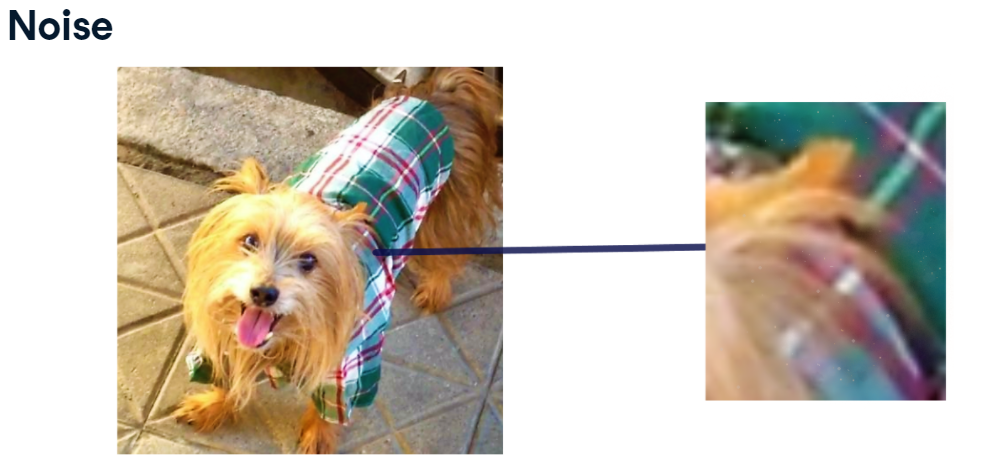

More specifically, noise is the result of errors in the image acquisition process that result in pixel values that do not reflect the true intensities of the real scene. 

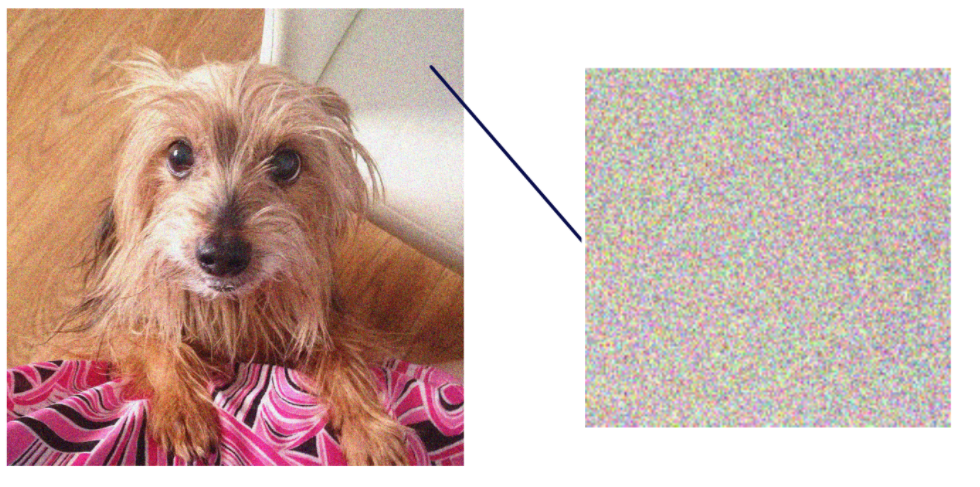

In this image we can see how there is a variation of brightness and color that does not correspond to reality, which is produced by the camera.

We can add noise to an image using scikit-image, with the random noise function from the "util" module. 

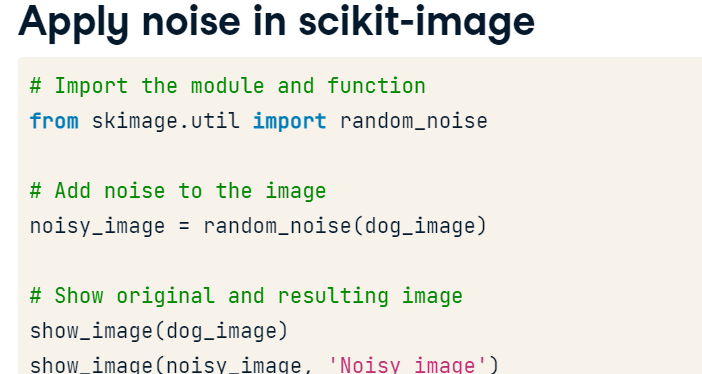

Now, we need to import the util module and the random_noise function. We can then add random noise of various types to the image by using this function. After doing this, we obtain a new image named noisy_image. 

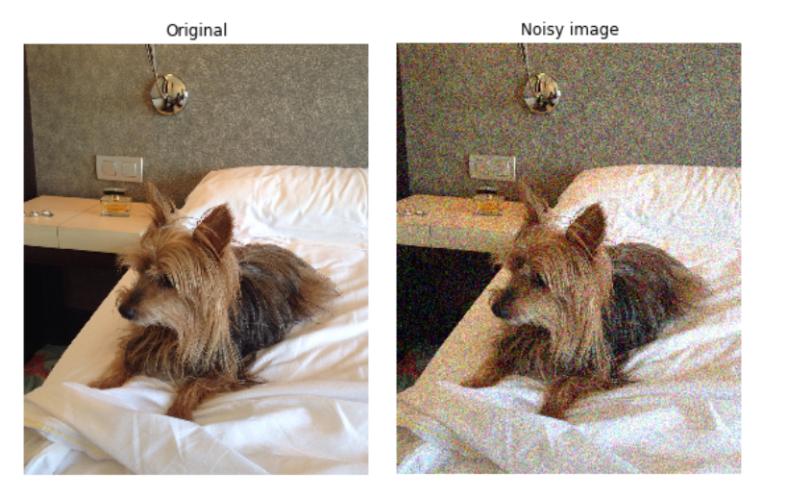

To compare the original and resulting noisy image we can show them side-by-side using the show_image function.

By using the random_noise function, we obtain the original image with a lot of added noise, that is distributed randomly. This type of noise is known as "salt and pepper" because that's in fact what it looks like. So we now know how to "mess up" a picture and use it for testing purposes.

Most of the times we will want to remove or reduce the noise of images instead of adding it in. Like in this example, 

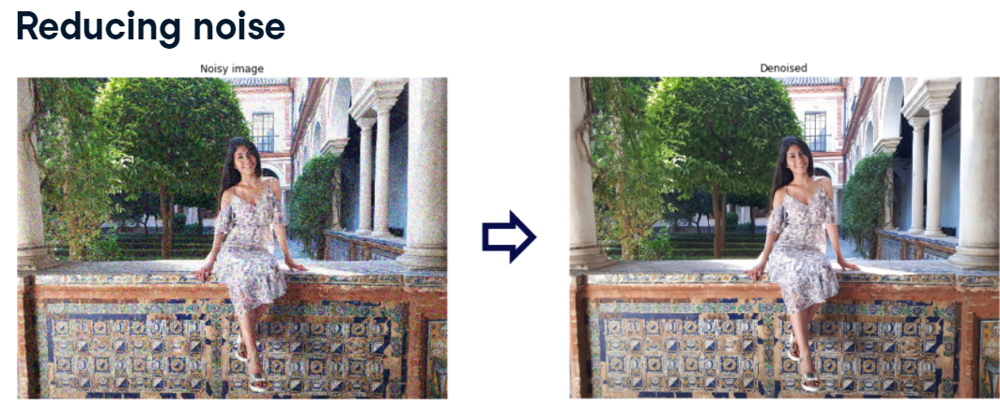

For that, we can use several algorithms in scikit-image. The higher the resolution of the image, the longer it may take to eliminate the noise.

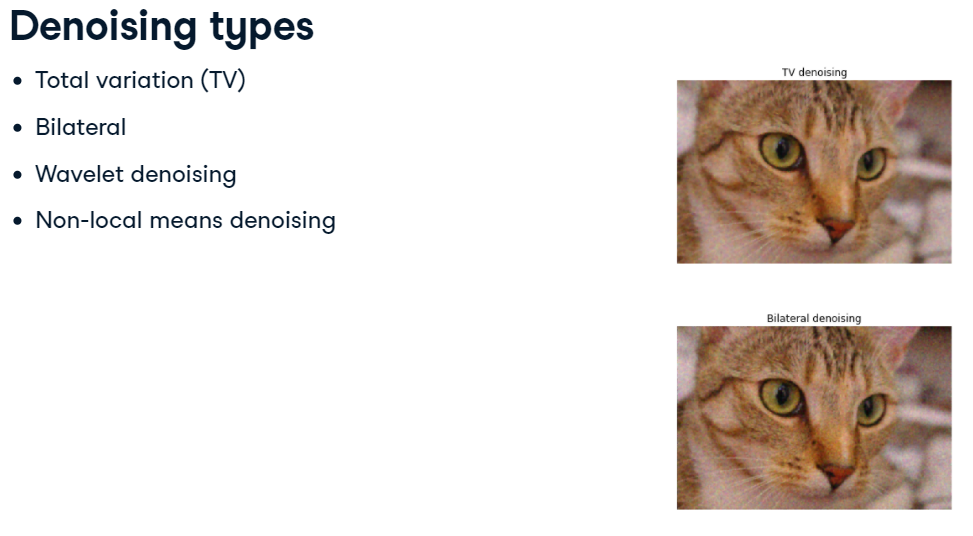

Some types of denoising algorithms are: The total variation filter. This filter tries to minimize the total variation of the image. It tends to produce “cartoon-like” images, that is, piecewise-constant images. Bilateral filtering smooths images while preserving edges. It replaces the intensity of each pixel with a weighted average of intensity values from nearby pixels. In this course, we'll focus on these two. But there are also The wavelet denoising filter and Non-local means denoising.

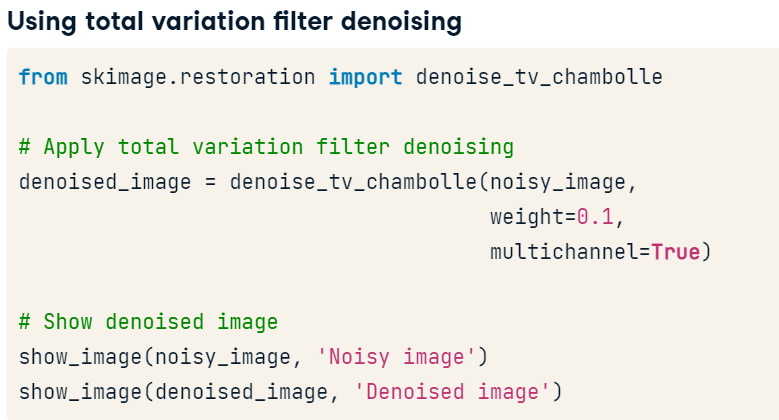

We can perform total variation filter denoising with the denoise tv chambolle function from the restoration module. When applying this function, we can optionally set the denoising weight. The greater the weight, the more denoising but it could also make the image smoother. We can also specify if the image is multichannel (colored) or not. The final step is to show the original image compared with the resulting one.

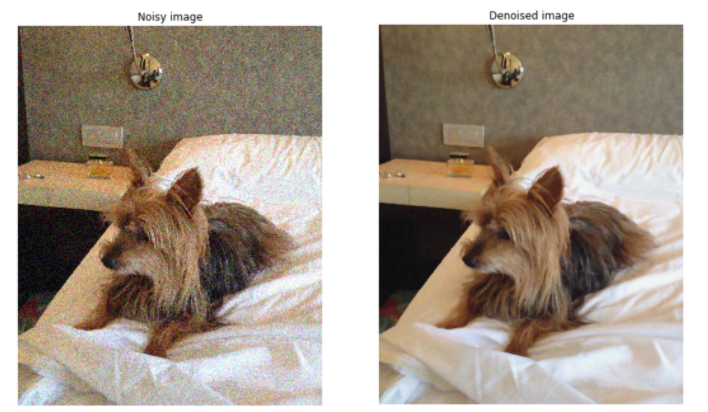

We see that we obtain a denoised image with the edges preserved but a little bit smooth or blurry.

Bilateral filter denoising is accessible through the denoise bilateral function also from the restoration module. We apply it to the noisy image, set multichannel to the appropriate value, and we can leave other options to the default. Now we'll see the original and the resulting one to compare.

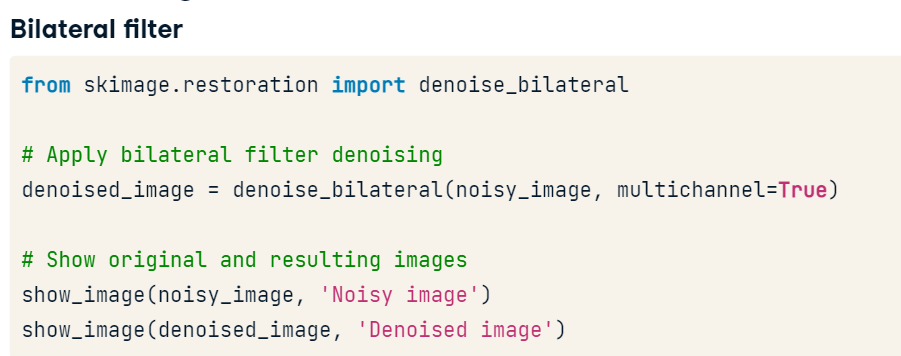

The resulting image is less smooth than the one from the total variation filter. And preserves the edges a lot more.

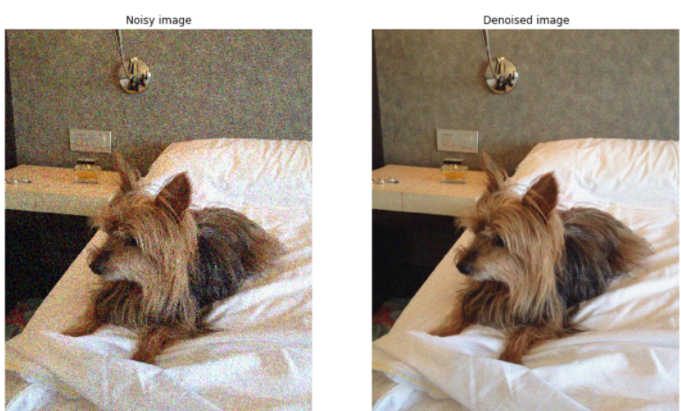

### Let's make some noise!
In this exercise, we'll practice adding noise to a fruit image.

![rsu](./images/fruits_square.jpg)



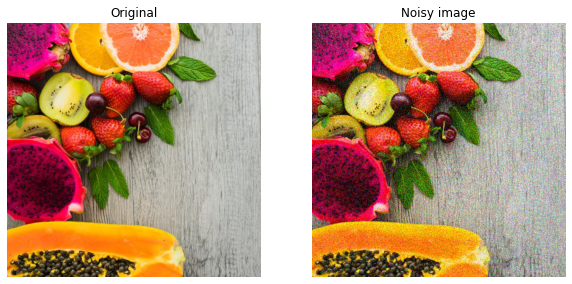

In [14]:
from skimage.util import random_noise

fruit_image = plt.imread('./images/fruits_square.jpg')

# Add noise to the image
noisy_image = random_noise(fruit_image)

# Show th original and resulting image
plot_comparison(fruit_image, noisy_image, 'Noisy image')

Now we can add noise to any image we work with.

### Reducing noise
We have a noisy image that we want to improve by removing the noise in it.

Use total variation filter denoising to accomplish this.

![rsu1](./images/miny.jpeg)



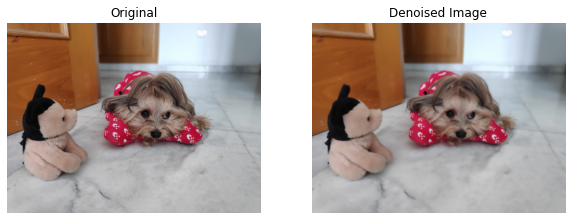

In [15]:
from skimage.restoration import denoise_tv_chambolle

noisy_image = plt.imread('./images/miny.jpeg')

# Apply total variation filter denoising
denoised_image = denoise_tv_chambolle(noisy_image, multichannel=True)

# Show the noisy and denoised image
plot_comparison(noisy_image, denoised_image, 'Denoised Image')

We fixed the image by applying the TV denoising function with the parameter default values.

### Reducing noise while preserving edges
In this exercise, you will reduce the noise in this landscape picture.

Since we prefer to preserve the edges in the image, we'll use the bilateral denoising filter.

![rs3u1](./images/noise-noisy-nature.jpg)


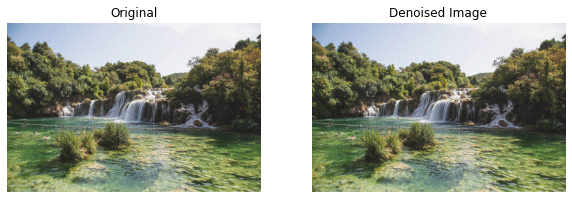

In [18]:
from skimage.restoration import denoise_bilateral

landscape_image = plt.imread('./images/noise-noisy-nature.jpg')

# Apply bilateral filter denoising
denoised_image = denoise_bilateral(landscape_image, multichannel=True)

# Show original and resulting images
plot_comparison(landscape_image, denoised_image, 'Denoised Image')

We denoised the image without losing sharpness.